## Basical settings

(Copied from the last file)

Import packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.modeling import models
from astropy.modeling import functional_models
from astropy import units as u
import os, json, random, cv2
from PIL import Image
from numpyencoder import NumpyEncoder
import multiprocessing
import time
import torch

import utils

# for testing purpose
import importlib
importlib.reload(utils)

plt.rcParams["figure.figsize"] = (15,10)
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# !nvidia-smi
print(torch.__version__)
print(torch.cuda.is_available())

1.13.0
True


Global variables

In [3]:
wavelengths = np.arange(400, 800)*u.nm
FWHM        = 0.5
lambda_Na   = 589.0*u.nm
lambda_Mg   = 518.3*u.nm
width       = 1000
height      = 1500

dir='./dataset/'
os.makedirs(dir, exist_ok=True)

## Register data

Try to read the dataset we have just generated and confirm that the data is correctly loaded and labelled 

In [4]:
from detectron2.data import DatasetCatalog
from detectron2.data import MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import Visualizer
import detectron2.solver as solver
import detectron2.modeling as modeler
import detectron2.data as data
from detectron2.engine import DefaultTrainer, SimpleTrainer
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.utils import comm

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from astropy.modeling import models
from astropy.modeling import functional_models
from astropy import units as u
import os, json, random, cv2, gc
from PIL import Image
from numpyencoder import NumpyEncoder

In [5]:
dir='./dataset/'

register_coco_instances('fake_meteors', {}, os.path.join(dir, 'labels.json'), dir)
MetadataCatalog.get("fake_meteors").keypoint_names = ['1', '2', '3', '4']
MetadataCatalog.get("fake_meteors").keypoint_flip_map = ()
# del MetadataCatalog.get("fake_meteors").keypoint_connection_rules
MetadataCatalog.get("fake_meteors").keypoint_connection_rules=[('1', '2', (102, 204, 255)), ('3', '4', (255, 195, 77))]

To see if we have loaded the correct dataset

(1000, 1500, 3)


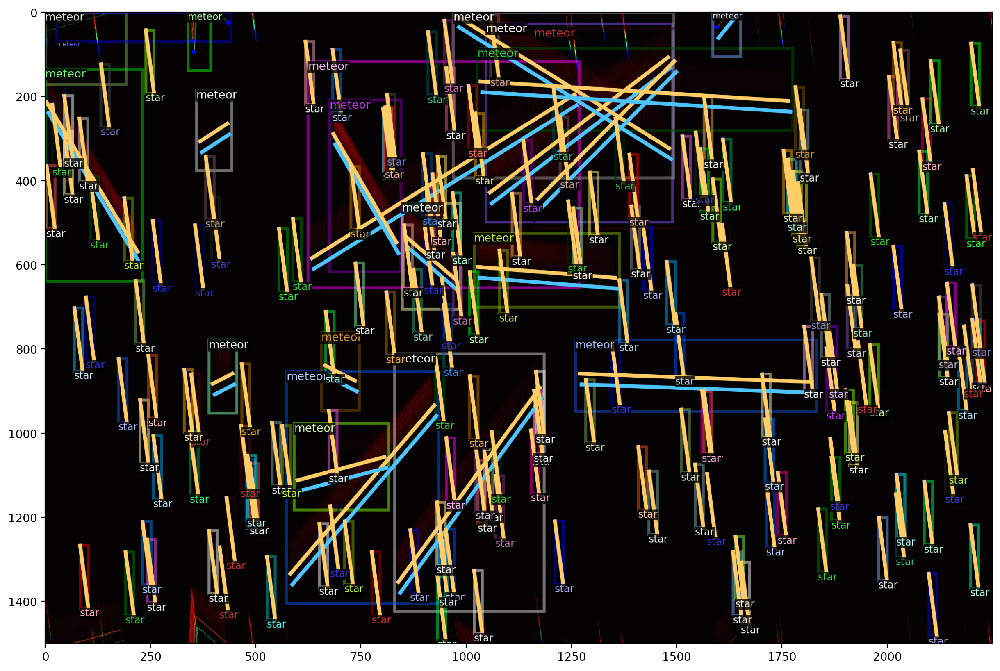

In [6]:
dataset_dicts = DatasetCatalog.get('fake_meteors')
metadata = MetadataCatalog.get('fake_meteors')

for d in random.sample(dataset_dicts, 1):
    img = plt.imread(d["file_name"])
    print(img.shape)
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=1.5)
    out = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=[15, 10])
    plt.imshow(out.get_image()[:, :, ::-1])


## Train

Using `R50-FPN 3x` model in `COCO Person Keypoint Detection Baselines with Keypoint R-CNN` 

Configuration reference: [https://detectron2.readthedocs.io/en/latest/modules/config.html](https://detectron2.readthedocs.io/en/latest/modules/config.html)

In [16]:
from detectron2.engine import DefaultTrainer
from detectron2 import model_zoo
from detectron2.config import get_cfg

out_dir = './output/'
os.makedirs(out_dir, exist_ok=True)

cfg = get_cfg()

cfg.OUTPUT_DIR = out_dir
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("fake_meteors",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 1
cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 4
cfg.TEST.DETECTIONS_PER_IMAGE = 220 # max 200 stars + 20 meteors

# del MetadataCatalog.get("fake_meteors").thing_classes
# MetadataCatalog.get("fake_meteors").thing_classes = ['meteor']
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.


Rewrite trainer

imple trainer: [https://detectron2.readthedocs.io/en/latest/_modules/detectron2/engine/train_loop.html#SimpleTrainer](https://detectron2.readthedocs.io/en/latest/_modules/detectron2/engine/train_loop.html#SimpleTrainer)

In [9]:
class CustomTrainer(SimpleTrainer):
    def __init__(self, model, data_loader, optimizer, cfg):
        super().__init__(model, data_loader, optimizer)

        self.lossList = []
        self.period = 20
        self.iterCount = 0
    
    # NOTE: print out loss over p iterations
    def set_period(self,p):
        self.period = p

    # def run_step(self):
    #     self.iterCount = self.iterCount + 1

    #     assert self.model.training, "[SimpleTrainer] model was changed to eval mode!"
    #     start = time.perf_counter()

    #     data_time = time.perf_counter() - start
    #     data = next(self._data_loader_iter)
        
    #     # Note: in training mode, model() returns loss
    #     loss_dict = self.model(data)
    #     #print('Loss dict',loss_dict)
    #     if isinstance(loss_dict, torch.Tensor):
    #         losses = loss_dict
    #         loss_dict = {"total_loss": loss_dict}
    #     else:
    #         losses = sum(loss_dict.values())
        
    #     self.optimizer.zero_grad()
    #     losses.backward()
    #     self.optimizer.step()
        
    #     if self.iterCount % self.period == 0 and comm.is_main_process():
    #         self._write_metrics(loss_dict, data_time)
        
    #     self.lossList.append(losses.cpu().detach().numpy())

    # def resume_or_load(self, resume=True):
    #     self.checkpointer.resume_or_load(self.cfg.MODEL.WEIGHTS, resume=resume)
    #     if resume and self.checkpointer.has_checkpoint():
    #         # The checkpoint stores the training iteration that just finished, thus we start
    #         # at the next iteration
    #         self.start_iter = self.iter + 1

# model = modeler.build_model(cfg)
# loader = data.build_detection_train_loader(cfg)
# optimizer = solver.build_optimizer(cfg, model)
trainer = DefaultTrainer(cfg)
# trainer = CustomTrainer(model, loader, optimizer, cfg) 
# trainer.set_period(200) # print loss every n iterations
trainer.resume_or_load(resume=False)
# trainer.train(0, 4000)

[03/05 16:35:32 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

R-101.pkl:  19%|█▉        | 34.2M/179M [00:01<00:07, 18.6MB/s]  


KeyboardInterrupt: 

Transfer learning

In [17]:
print('Training head')

cfg.MODEL.BACKBONE.FREEZE_AT = 4   # Initial re-training of the head layers (i.e. freeze the backbone)
cfg.SOLVER.BASE_LR = 0.001    
cfg.SOLVER.STEPS = []          # do not decay learning rate for retraining head layers
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"
cfg.SOLVER.WARMUP_ITERS = 0
cfg.SOLVER.MAX_ITER = 40
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()


Training head
[03/05 21:59:55 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
    

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (2, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (2,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (4, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (4,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.keypoint_head.score_lowres.weight' to the model due to incompatible shapes: (512, 17, 4, 4) in the checkpoint but (512, 4, 4, 4) i

[03/05 21:59:55 d2.engine.train_loop]: Starting training from iteration 0


/home/chisen/anaconda3/envs/py39-wsl2/lib/python3.9/site-packages/detectron2/structures/keypoints.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1666642975993/work/torch/csrc/utils/tensor_new.cpp:230.)
  keypoints = torch.as_tensor(keypoints, dtype=torch.float32, device=device)


[03/05 22:00:07 d2.utils.events]:  eta: 0:00:10  iter: 19  total_loss: 8.444  loss_cls: 0.6363  loss_box_reg: 0.3488  loss_keypoint: 6.959  loss_rpn_cls: 0.3301  loss_rpn_loc: 0.2766  time: 0.5410  data_time: 0.1666  lr: 0.001  max_mem: 7426M
[03/05 22:00:20 d2.utils.events]:  eta: 0:00:00  iter: 39  total_loss: 6.745  loss_cls: 0.4292  loss_box_reg: 0.3474  loss_keypoint: 5.685  loss_rpn_cls: 0.1486  loss_rpn_loc: 0.2151  time: 0.5422  data_time: 0.1585  lr: 0.001  max_mem: 7426M
[03/05 22:00:20 d2.engine.hooks]: Overall training speed: 38 iterations in 0:00:20 (0.5422 s / it)
[03/05 22:00:20 d2.engine.hooks]: Total training time: 0:00:22 (0:00:01 on hooks)


In [20]:
torch.cuda.empty_cache()

print('Training full model')

cfg.MODEL.BACKBONE.FREEZE_AT = 0  # unfreeze all backbone layers  
cfg.SOLVER.MAX_ITER = 80          # for LR scheduling
cfg.SOLVER.BASE_LR = 0.0001   
cfg.SOLVER.STEPS = [20, 60]        # decay learning rate
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"
cfg.SOLVER.WARMUP_ITERS = 0
cfg.MODEL.WEIGHTS = os.path.join(out_dir, 'model_final.pth')  # Initialize from a local weights
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

# TODO: print('Saving loss')

# np.save(out_dir+'_losses',trainer.lossList)
# np.save(out_dir+'_val_losses',trainer.vallossList)



Training full model
[03/05 22:01:08 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        

/home/chisen/anaconda3/envs/py39-wsl2/lib/python3.9/site-packages/detectron2/structures/keypoints.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1666642975993/work/torch/csrc/utils/tensor_new.cpp:230.)
  keypoints = torch.as_tensor(keypoints, dtype=torch.float32, device=device)


[03/05 22:01:57 d2.utils.events]:  eta: 0:01:34  iter: 19  total_loss: 6.247  loss_cls: 0.3848  loss_box_reg: 0.3584  loss_keypoint: 5.164  loss_rpn_cls: 0.1306  loss_rpn_loc: 0.2011  time: 2.4949  data_time: 0.1706  lr: 0.0001  max_mem: 7426M
[03/05 22:02:25 d2.utils.events]:  eta: 0:00:57  iter: 39  total_loss: 6.137  loss_cls: 0.378  loss_box_reg: 0.3282  loss_keypoint: 5.13  loss_rpn_cls: 0.1162  loss_rpn_loc: 0.1827  time: 1.9323  data_time: 0.1517  lr: 1e-05  max_mem: 7426M
[03/05 22:03:21 d2.utils.events]:  eta: 0:00:29  iter: 59  total_loss: 6.095  loss_cls: 0.3887  loss_box_reg: 0.3225  loss_keypoint: 5.077  loss_rpn_cls: 0.1254  loss_rpn_loc: 0.1839  time: 2.2325  data_time: 0.1517  lr: 1e-05  max_mem: 7426M
[03/05 22:03:52 d2.utils.events]:  eta: 0:00:00  iter: 79  total_loss: 5.991  loss_cls: 0.3813  loss_box_reg: 0.317  loss_keypoint: 4.992  loss_rpn_cls: 0.1162  loss_rpn_loc: 0.1778  time: 2.0255  data_time: 0.1511  lr: 1e-06  max_mem: 7426M
[03/05 22:03:52 d2.engine.hook

# Evaluation

See how it works in our validation dataset (TODO) and the real image

Reference of the real image: `2021JIMO...49...71Z`

[03/05 22:03:59 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

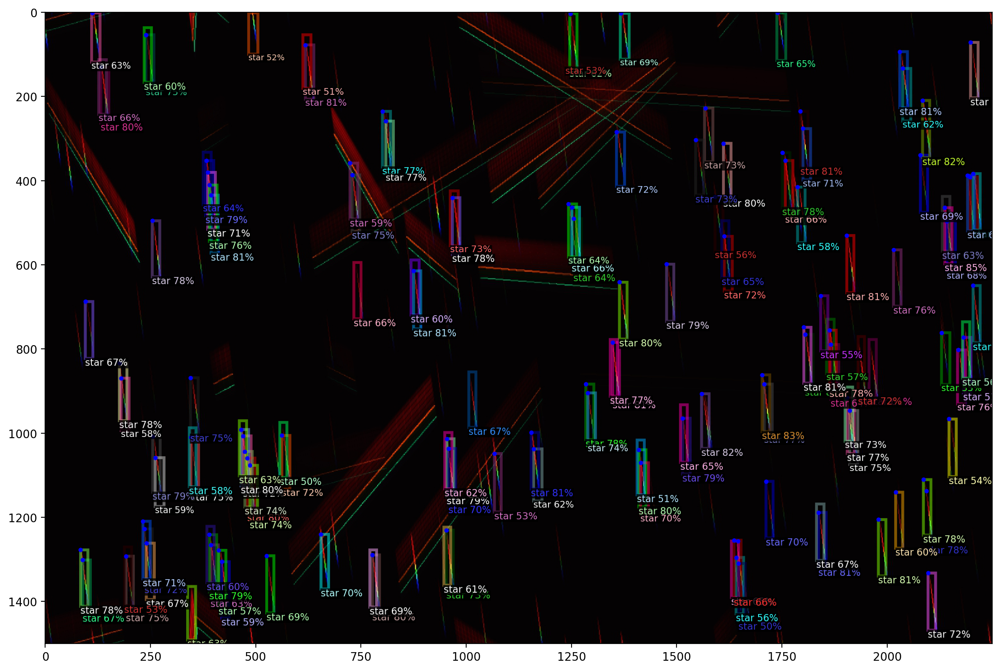

In [21]:
from detectron2.engine import DefaultPredictor

# cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_101_FPN_3x.yaml"))

cfg.MODEL.WEIGHTS = os.path.join(out_dir, 'model_final.pth')
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.TEST.KEYPOINT_OKS_SIGMAS = [1, 1, 1, 1]
# for d in random.sample(dataset_dicts, 1):    
im = plt.imread(d["file_name"])
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:,:,::-1], metadata, scale=1.5)
# print(outputs["instances"])
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize=[15, 10])
plt.imshow(out.get_image()[:, :, ::-1])

WARNING [03/05 21:09:37 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.bbox_pred.bias in checkpoint is torch.Size([12]), while shape of roi_heads.box_predictor.bbox_pred.bias in model is torch.Size([4]).
WARNING [03/05 21:09:37 d2.checkpoint.c2_model_loading]: roi_heads.box_predictor.bbox_pred.bias will not be loaded. Please double check and see if this is desired.
WARNING [03/05 21:09:37 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.bbox_pred.weight in checkpoint is torch.Size([12, 1024]), while shape of roi_heads.box_predictor.bbox_pred.weight in model is torch.Size([4, 1024]).
WARNING [03/05 21:09:37 d2.checkpoint.c2_model_loading]: roi_heads.box_predictor.bbox_pred.weight will not be loaded. Please double check and see if this is desired.
WARNING [03/05 21:09:37 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.cls_score.bias in checkpoint is torch.Size([4]), while shape of roi_heads.box_predictor.cls_score.bias in model is tor

Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (12,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (12, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (4,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (4, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight

WARNING [03/05 21:09:42 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.bbox_pred.bias in checkpoint is torch.Size([12]), while shape of roi_heads.box_predictor.bbox_pred.bias in model is torch.Size([4]).
WARNING [03/05 21:09:42 d2.checkpoint.c2_model_loading]: roi_heads.box_predictor.bbox_pred.bias will not be loaded. Please double check and see if this is desired.
WARNING [03/05 21:09:42 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.bbox_pred.weight in checkpoint is torch.Size([12, 1024]), while shape of roi_heads.box_predictor.bbox_pred.weight in model is torch.Size([4, 1024]).
WARNING [03/05 21:09:42 d2.checkpoint.c2_model_loading]: roi_heads.box_predictor.bbox_pred.weight will not be loaded. Please double check and see if this is desired.
WARNING [03/05 21:09:42 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.cls_score.bias in checkpoint is torch.Size([4]), while shape of roi_heads.box_predictor.cls_score.bias in model is tor

Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (12,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (12, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (4,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (4, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight

WARNING [03/05 21:09:47 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.bbox_pred.bias in checkpoint is torch.Size([12]), while shape of roi_heads.box_predictor.bbox_pred.bias in model is torch.Size([4]).
WARNING [03/05 21:09:47 d2.checkpoint.c2_model_loading]: roi_heads.box_predictor.bbox_pred.bias will not be loaded. Please double check and see if this is desired.
WARNING [03/05 21:09:47 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.bbox_pred.weight in checkpoint is torch.Size([12, 1024]), while shape of roi_heads.box_predictor.bbox_pred.weight in model is torch.Size([4, 1024]).
WARNING [03/05 21:09:47 d2.checkpoint.c2_model_loading]: roi_heads.box_predictor.bbox_pred.weight will not be loaded. Please double check and see if this is desired.
WARNING [03/05 21:09:47 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.cls_score.bias in checkpoint is torch.Size([4]), while shape of roi_heads.box_predictor.cls_score.bias in model is tor

Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (12,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (12, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (4,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (4, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight

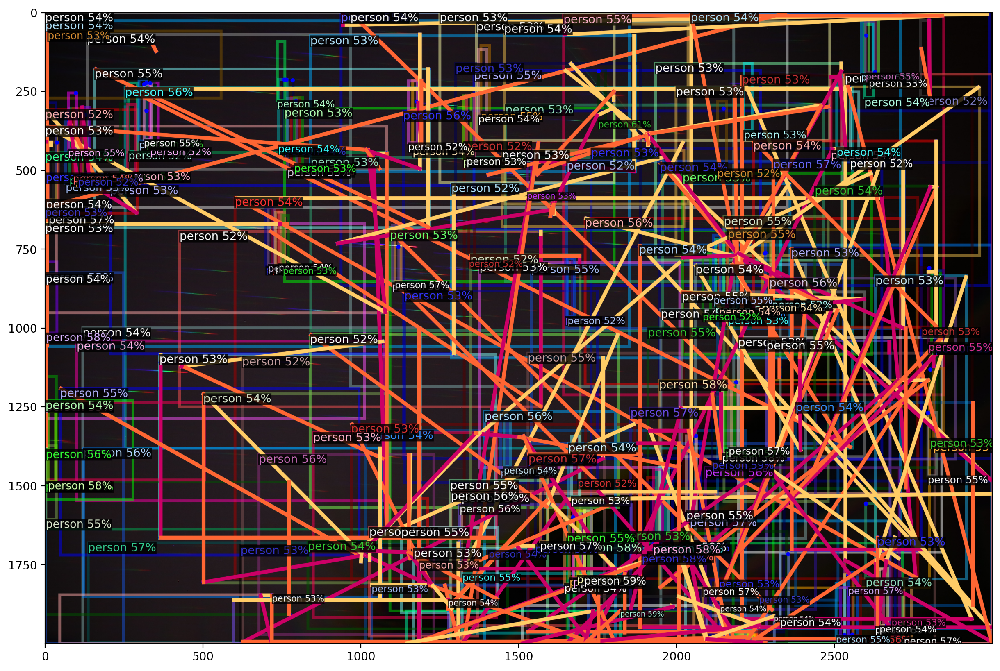

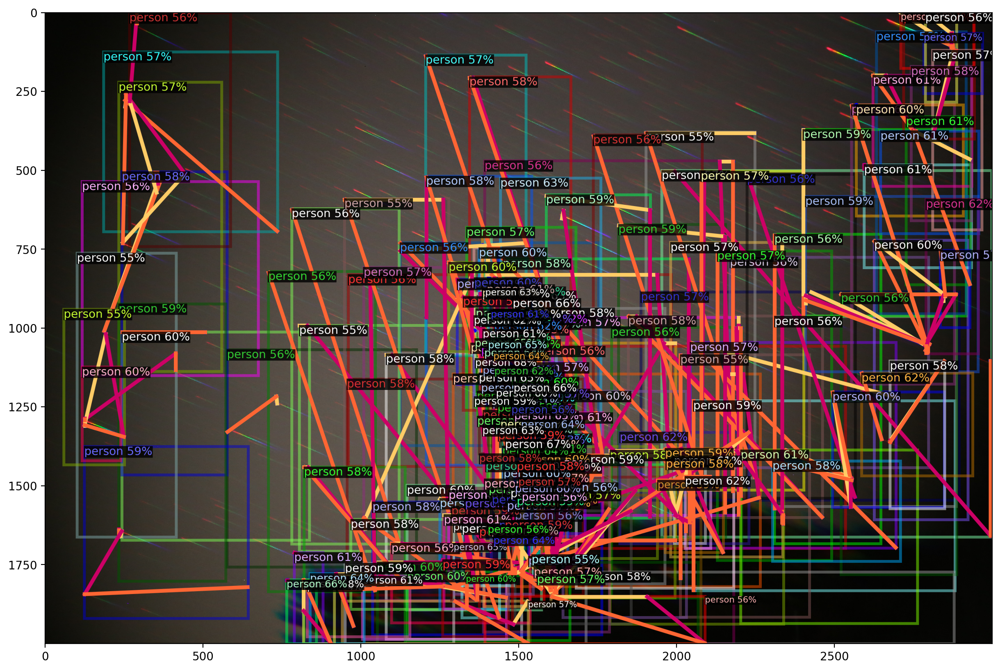

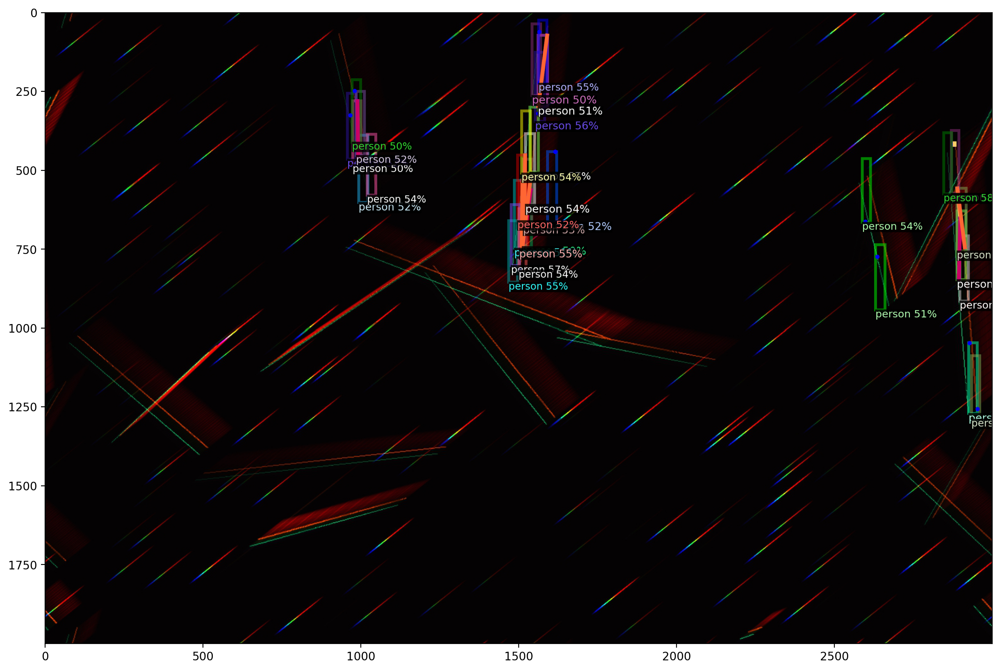

In [13]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
del MetadataCatalog.get("fake_meteors").keypoint_names
MetadataCatalog.get("fake_meteors").keypoint_names = ['1', '2', '3', '4']

for im in [plt.imread("testimg/testimg2.jpg"), plt.imread("testimg/testimg.jpg"),  plt.imread("dataset/999_20230305-043953.jpg")]:
    im = cv2.resize(im, dsize=(1500, 1000), interpolation=cv2.INTER_CUBIC)
    # print(im.shape, im.dtype)
    predictor = DefaultPredictor(cfg)
    outputs = predictor(im)
    v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize=[15, 10])
    plt.imshow(out.get_image()[:, :, ::-1])